# Content <a id='content'></a>

[Introduction](#intro)

[Datasets](#datasets)

[Data overview](#prep)

[ML](#ml)

[Well profitability analysis](#profit)

[Conclusions](#conclusions)

# Introduction <a id='intro'></a>

I took a task of finding the best place for a new well for the OilyGiant mining company. To accomplish it, we will work through the following steps:

1. Collect the oil well parameters in the selected region: oil quality and volume of reserves;
2. Build a model for predicting the volume of reserves in the new wells;
3. Define the profit calculation method;
4. Pick the oil wells with the highest estimated profit margin;
5. Pick the region with the highest total potential profit for the selected oil wells and estimate risks using the Bootstrapping technique.

# Datasets <a id='datasets'></a>

We have geological exploration data for the three regions are stored in files:

- `geo_data_0.csv.`
- `geo_data_1.csv.`
- `geo_data_2.csv.`
- `id` — unique oil well identifier
- `f0`, `f1`, `f2` — three features of points
- `product` — volume of reserves in the oil well (thousand barrels).

Previously known information:
1. Only linear regression is suitable for model training (the rest are not sufficiently predictable).
2. When exploring the region, a study of 500 points is carried with picking the best 200 points for the profit calculation.
3. The budget for development of 200 oil wells is 100 USD million.
4. One barrel of raw materials brings 4.5 USD of revenue The revenue from one unit of product is 4,500 dollars (as mention above, the volume of reserves is measured in thousand barrels).
5. After the risk evaluation, only the regions with the risk of losses lower than 2.5% should be kept. From the ones that fit the criteria, the region with the highest average profit should be selected.
6. The data is synthetic: contract details and well characteristics are not disclosed.
7. The specific meaning of the features is unimportant, but the features themselves are significant.

[Back to Content](#content)

# Data overview <a id='prep'></a>

Let's move on with the first step and download and prepare the data.

## Libraries

In [1]:
# import potentially necessary libraris and functions
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.dummy import DummyRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

from math import sqrt
from scipy import stats as st

## File upload

We will use a load() function to avoid potential problems with the file pathes.

In [2]:
# function `load` for a csv load with try-except and a number of rows limit
def load(filename, sep = ',', nrow = None):
    """
    i=In addition to the file name, the function takes nrows parameter
    for a particular number of rows to load. If None, then the file is loaded fully.
    """
    try:
        df_raw = pd.read_csv(filename, sep = sep, nrows = nrow)
    except:
        df_raw = pd.read_csv('/'+filename, sep = sep, nrows = nrow)
    return df_raw

In [3]:
# chec the dataset data types and memory usage on the first 500 rows
geo_1 = load('datasets/geo_data_0.csv', nrow = 500)

In [4]:
geo_1.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   id       500 non-null    object 
 1   f0       500 non-null    float64
 2   f1       500 non-null    float64
 3   f2       500 non-null    float64
 4   product  500 non-null    float64
dtypes: float64(4), object(1)
memory usage: 46.0 KB


In [5]:
geo_1.head()

,id,f0,f1,f2,product
0,txEyH,0.705745,-0.497823,1.221170,105.280062
1,2acmU,1.334711,-0.340164,4.365080,73.037750
2,409Wp,1.022732,0.151990,1.419926,85.265647
3,iJLyR,-0.032172,0.139033,2.978566,168.620776
4,Xdl7t,1.988431,0.155413,4.751769,154.036647


The data types and the column names are correct, the dataset does not look like the most memory-intensive, let's upload it alltogether:

In [6]:
geo_1 = load('datasets/geo_data_0.csv')

In [7]:
geo_1.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 9.0 MB


Let's upload the other two datasets:

In [8]:
geo_2 = load('datasets/geo_data_1.csv')

In [9]:
geo_3 = load('datasets/geo_data_2.csv')

In [10]:
geo_2.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 9.0 MB


In [11]:
geo_3.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 5 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   id       100000 non-null  object 
 1   f0       100000 non-null  float64
 2   f1       100000 non-null  float64
 3   f2       100000 non-null  float64
 4   product  100000 non-null  float64
dtypes: float64(4), object(1)
memory usage: 9.0 MB


## Basic stats

Just to be on the safe side, let's check that the data does not contain duplciated data points.

In [12]:
geo_1.duplicated().sum(), geo_2.duplicated().sum(), geo_3.duplicated().sum()

(0, 0, 0)

No duplicates as well. Let's check some basic stats to gain the first impression.

In [13]:
geo_1.describe().T

,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.500419,0.871832,-1.408605,-0.072580,0.502360,1.073581,2.362331
f1,100000.0,0.250143,0.504433,-0.848218,-0.200881,0.250252,0.700646,1.343769
f2,100000.0,2.502647,3.248248,-12.088328,0.287748,2.515969,4.715088,16.003790
product,100000.0,92.500000,44.288691,0.000000,56.497507,91.849972,128.564089,185.364347


In [14]:
geo_2.describe().T

,count,mean,std,min,25%,50%,75%,max
f0,100000.0,1.141296,8.965932,-31.609576,-6.298551,1.153055,8.621015,29.421755
f1,100000.0,-4.796579,5.119872,-26.358598,-8.267985,-4.813172,-1.332816,18.734063
f2,100000.0,2.494541,1.703572,-0.018144,1.000021,2.011479,3.999904,5.019721
product,100000.0,68.825000,45.944423,0.000000,26.953261,57.085625,107.813044,137.945408


In [15]:
geo_3.describe().T

,count,mean,std,min,25%,50%,75%,max
f0,100000.0,0.002023,1.732045,-8.760004,-1.162288,0.009424,1.158535,7.238262
f1,100000.0,-0.002081,1.730417,-7.084020,-1.174820,-0.009482,1.163678,7.844801
f2,100000.0,2.495128,3.473445,-11.970335,0.130359,2.484236,4.858794,16.739402
product,100000.0,95.000000,44.749921,0.000000,59.450441,94.925613,130.595027,190.029838


Actually, it looks like the regions differ in some meaningful way by the features and volumes of reserves in the wells with the first and the third region demonstrating some minor similarity, on the `f2` feature and `product` only.

## Quick summay on the data overview

1. We have uploaded the three datasets for three regions, of 100000 data points each, all columns and data types correct, no missing values, no duplicates.
2. The regions differ in some meaningful way by the features and volumes of reserves in the wells with the first and the third region demonstrating some minor similarity, on the `f2` feature and `product` only; all three regions have similar standart deviation of the `product` values, though the second region has 50 lower average volume and is more skewed due to outliers.
3. In addition, the `product` variable seems to be of a different scale, as compared to the three features of the well points, but this is our target variable; thus, no need to apply a feature scaling procedure as a prerequisite for the model training.

Let's train and test the model for each region.

[Back to Content](#content)

# Machine Learning <a id='ml'></a>

We have been instructed beforehand, that only linear regression is suitable for model training. Thus, in this part we will build a linear regression model. To this end, we will implement the following steps:

1. Split the data into a training and validation subsets (we have a basic linear regression here, no regularization and other optimizations; hence, no need to split into training, validation and testing).
2. Train the model and make predictions for the test set.
3. Save the predictions and correct answers for the test set.
4. Find the average volume of predicted reserves and model RMSE.
5. Analyze the results.

### Split the data

Note: as part of the dataset splitting , we should drop the non-explanatory `id` column:

Let's put together a function to split several datasets of the kind we have been given:

In [16]:
def data_split(df):
    """This function divides the data into features (the X matrix) and a target variable (y)"""
    X = df.drop(['id', 'product'], axis = 1)
    y = df['product']
    
    # divide the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 12345)
    
    return X_train, X_test, y_train, y_test

In [17]:
X1_train, X1_test, y1_train, y1_test = data_split(geo_1)

In [18]:
X2_train, X2_test, y2_train, y2_test = data_split(geo_2)

In [19]:
X3_train, X3_test, y3_train, y3_test = data_split(geo_3)

To store these and the following results we will manage a dictionary: 

In [20]:
geo_dict = {
    'geo_1': {'data': (X1_train, X1_test, y1_train, y1_test)},
    'geo_2': {'data': (X2_train, X2_test, y2_train, y2_test)},
    'geo_3': {'data': (X3_train, X3_test, y3_train, y3_test)}
} # initialize dictionary of region-wise dictionaries and store the splitted datasets under `data` key.

### Modeling

Let's put together a function to  run the model:

In [21]:
def model_run(estimator, feat_train, target_train, feat_val, target_val):
    """The function takes a model, the training and validation datasets, prints the ML results, and returns predictions"""
    
    # to allow more flexibility, we use the subsets of data as variables
    estimator.fit(feat_train, target_train)
    predicted_val = estimator.predict(feat_val)
    print(f'MSE:{mean_squared_error(target_val, predicted_val):.2f}')
    print(f'RMSE:{sqrt(mean_squared_error(target_val, predicted_val)):.2f}')
    print(f'Coefficient of determination:{estimator.score(feat_val, target_val):.2f}')
    print(f'Average volume of predicted reserves: {predicted_val.mean():.2f}')
    
    return pd.DataFrame(predicted_val, columns = ['lr_predictions'])

In [22]:
# declare the model
model = LinearRegression()

Let's run the model for the three regions:

In [23]:
for key in geo_dict:
    print(f"Region {key}:")
    geo_dict[key]['lr_predictions'] = model_run(model,
                                                geo_dict[key]['data'][0],
                                                geo_dict[key]['data'][2],
                                                geo_dict[key]['data'][1],
                                                geo_dict[key]['data'][3]
    ) # store the results under the `lr_predictions` key

Region geo_1:
MSE:1412.21
RMSE:37.58
Coefficient of determination:0.28
Average volume of predicted reserves: 92.59
Region geo_2:
MSE:0.80
RMSE:0.89
Coefficient of determination:1.00
Average volume of predicted reserves: 68.73
Region geo_3:
MSE:1602.38
RMSE:40.03
Coefficient of determination:0.21
Average volume of predicted reserves: 94.97


The results are pretty strange in terms of the model quality with the second region demonstrating perfect predictive capability of the linear regression, while the first and the third regions demonstarte similarity again in the poor model quality. We remember that the data is simulated, but as one check up, which can help in understanding the reasons for that difference, let's try to visualize the data points as a flow of feature values ([inspired by this article](https://towardsdatascience.com/histogram-on-function-space-4a710241f026)):

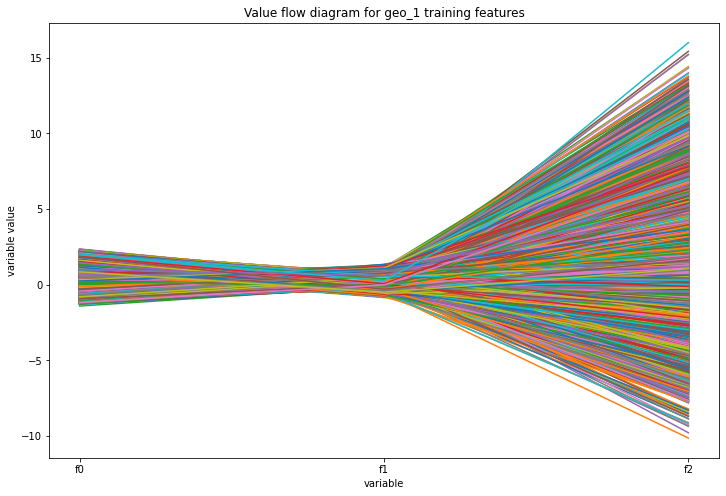

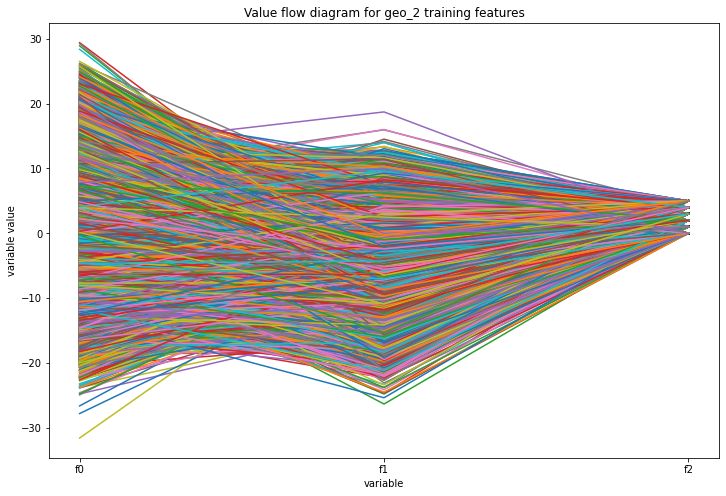

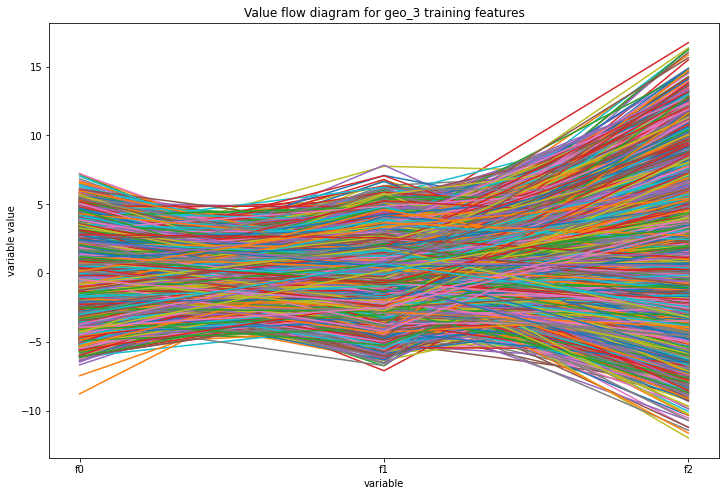

In [24]:
for key in geo_dict:
    plt.figure(figsize=(12,8))
    plt.plot(geo_dict[key]['data'][0].T)
    plt.xlabel('variable')
    plt.ylabel('variable value')
    plt.title(f"Value flow diagram for {key} training features")
    plt.show()

Well, assuming that the features of the data points are created in the same way, we see that the three regions have absolutely different characteristics, while the `f2` feature for the second region even has discrete number of values:

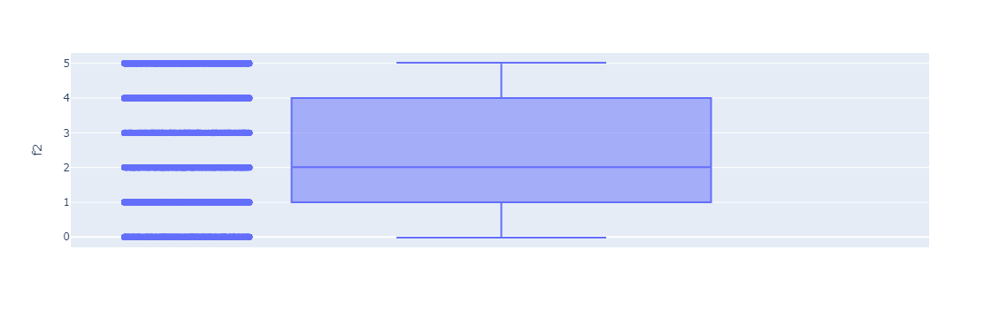

In [25]:
import plotly.express as px
fig = px.box(geo_2, y="f2", points="all")
fig.show()

[Back to Content](#content)

# Well profitability analysis <a id='profit'></a>

To analyse potential profit and risks, we will implement the following steps:

1. Prepare for profit calculation:

- Store all key values for calculations in separate variables.
- Calculate the volume of reserves sufficient for developing a new well without losses.
- Compare the obtained value with the average volume of reserves in each region.
- Derive preliminary observations.

2. Recommend a region and calculate profit from a set of selected oil wells and model predictions:
- Pick the wells with the highest values of predictions.
- Summarize the target volume of reserves in accordance with these predictions.
- Make a preliminary suggestion on a region for oil wells development. 
- Calculate the profit for the obtained volume of reserves.

3. Calculate risks and profit for each region:
- Use the bootstrapping technique with 1000 samples to find the distribution of profit.
- Find average profit, 95% confidence interval.
- Find risk of losses (loss is negative profit, we will calculate it as a probability and then express as a percentage).
- Make final suggestion on a region for oil wells' development. 

## Prepare for profit calculation

In [26]:
# Store all key values for calculations in separate variables
points = 500 # when exploring the region, a study of 500 points is carried
profitable_points = 200 # the number of the best wells to be picked for the profit calculation
dev_cost = 10**8 # the budget for development of 200 oil wells is 100 USD million
revenue_per_bbl = 4.5 # one barrel of raw materials brings 4.5 USD of revenue 
losses_treshold = 0.025 # the regions with the risk of losses lower than the threshold should be kept

In [27]:
# Calculate the volume of reserves sufficient for developing a new well without losses
min_reserves = dev_cost/profitable_points/revenue_per_bbl/1000 # the average budget per well / revenue per unit of reserves
print(f'The minimum volume of reserves sufficient for developing a new well without losses {min_reserves:.2f} units.')

The minimum volume of reserves sufficient for developing a new well without losses 111.11 units.


Thus, on average, the minimum volume of reserves sufficient for developing a new well without losses equals ~111 thousand barrels, while the average volume of reserves per well in all three regions is significantly lower, with the second region having almost 40% less on average per well than it is required.

## Choose region and calculate profit from a set of 200 highest model predictions

In [28]:
# the highest values of predictions and their total volume
def best_volumes(volumes_df, column_name, subset, print_statement = True):
    """This function picks the wells with the highest values and returns their total"""
    highest_volumes = volumes_df.sort_values(by = column_name, ascending=False) # sort values from highest to lowest
    selected_volumes_total = highest_volumes[:subset][column_name].sum()
    if print_statement:
        print(f'The highest values of predictions for this region is: {selected_volumes_total:.2f} thousand barrels.')
    
    return selected_volumes_total

Let's choose any 500 wells and calculate the total volume of the 200 which were predicted to be the largest ones among them.

In [29]:
state = np.random.RandomState(12345) 
for key in geo_dict:
    print(f"Region {key}:")
    geo_dict[key]['top_200_predictions_total'] = best_volumes(
                                                    geo_dict[key]['lr_predictions'].sample(n = points, random_state=state),
                                                    'lr_predictions',
                                                    profitable_points
    ) # store the results under the `top_200__predictions_total` key

Region geo_1:
The highest values of predictions for this region is: 23345.22 thousand barrels.
Region geo_2:
The highest values of predictions for this region is: 22766.89 thousand barrels.
Region geo_3:
The highest values of predictions for this region is: 23198.23 thousand barrels.


These results suggest that the preliminary recommendation can be focus on the first region, which has the highest estimated reserves for 200 largest wells out of a random set of 500 wells in the region, ~23.3 million barrels.  The profit for the obtained volume of reserves would be ~USD5 mln:

In [30]:
(geo_dict['geo_1']['top_200_predictions_total'] * revenue_per_bbl * 1000 - dev_cost)/10**6

5.05346895030579

Let's check what are the actual reserve volumes in the wells predicted to be the largest:

In [31]:
def best_volumes_test(lr_predictions_df, target_val_df, subset, print_statement = False):
    """This function picks the wells with the highest predicted values and returns their actual total.
    
    Note: Watch indices, they should be the same in both of the dataframes."""
    highest_volumes = lr_predictions_df.sort_values(by = 'lr_predictions',
                                                    ascending=False) # sort values from highest to lowest
    actual_volumes_of_highest = target_val_df[highest_volumes.index][:subset]
    selected_volumes_total = actual_volumes_of_highest.sum()
    if print_statement:
        print(f'The highest values of predictions for this region is: {selected_volumes_total:.2f} thousand barrels.')
    
    return selected_volumes_total

In [32]:
for key in geo_dict:
    print(f"Region {key}:")
    geo_dict[key]['top_200_predictions_actual_total'] = best_volumes_test(
                                                    geo_dict[key]['lr_predictions'].sample(n = points, random_state=state),
                                                    geo_dict[key]['data'][3].reset_index(drop = True),
                                                    profitable_points,
                                                    print_statement = True
    ) # store the results under the `top_200_predictions_actual_total` key

Region geo_1:
The highest values of predictions for this region is: 23511.47 thousand barrels.
Region geo_2:
The highest values of predictions for this region is: 23711.82 thousand barrels.
Region geo_3:
The highest values of predictions for this region is: 22609.03 thousand barrels.


Conclusion can be made that the linear regression model for the third region results in overestimated values and the one for the second region results in underestimated values; the ranking of the regions, if the actual reserve volumes are considered for the wells with highest predictions, changes, leaving us with the second region being the best candidate.

Let's check what is the total reserve volume in the wells which actually are the largest, when we randomly choose 500 wells:

In [33]:
for key in geo_dict:
    print(f"Region {key}:")
    geo_dict[key]['top_200_actual_total'] = best_volumes(
                                            pd.DataFrame(geo_dict[key]['data'][3]).sample(n = points, random_state=state),
                                            'product',
                                            profitable_points
    ) # store the results under the `top_200__predictions_total` key

Region geo_1:
The highest values of predictions for this region is: 27080.66 thousand barrels.
Region geo_2:
The highest values of predictions for this region is: 23239.38 thousand barrels.
Region geo_3:
The highest values of predictions for this region is: 28498.19 thousand barrels.


When we randomly choose 500 wells and check what is the reserves volume of the 200 largest of them, we end up with the third region being the leader.

## Calculate risks and the confidence level of the profit estimate for each region

To calculate the confidence level and estimate the risk of losses, we will apply the bootstrapping technique for assessing confidence intervals of ML models. In this case, bootstrapping refers to resampling data and instead of fitting the model to the original test features and target variable, fitting the model to resampled versions of them multiple times, 1000 in our case. Since we have already computed the predictions, instead fitting the model again, we can sample the original target test points and take corresponding predictions instead. For every run, after extracting the 200 top model predictions, we use the actual `product` values of those data points to calculate the actual profit. Then we use the 1000 of such estimates to derive the distribution of actual profits.

In [34]:
def profit(total_volume):
    """The function takes the total volume of 200 wells and returns the profit value from their development"""
    profit = total_volume * revenue_per_bbl*1000 - dev_cost
    return profit

In [35]:
def bootstrap_profit(target_val, lr_predictions):
    """The function realizes the bootstrapping technique with 1000 samples to find the distribution of profit"""
    state = np.random.RandomState(12345) 
    
    profit_dist = []
    for i in range(1000):
        target_val_reset = target_val.reset_index(drop = 'True') # reset the indices to correspond the predictions' indices
        target_subsample = target_val_reset.sample(n = points, replace=True, random_state=state) # sample the subsample
        predicted_subsample = lr_predictions.iloc[target_subsample.index] # choose predictions for the subsample points
        total_vol = best_volumes_test(predicted_subsample,
                                 target_subsample,
                                 profitable_points
        )
        profit_dist.append(profit(total_vol)) # store the predicted distribution
    
    return pd.DataFrame(profit_dist, columns = ['profit']).sort_values(by = 'profit')

In [36]:
def bootstrap_mean_profit_ci(target_val, lr_predictions):
    """The function computes the mean profit, the 95% CI, and the risk of losses for a bootstrapped distribution"""
    predicted_profit_dist = bootstrap_profit(target_val, lr_predictions)
    mean_profit = predicted_profit_dist.mean() # average profit
    confidence_interval = st.t.interval(
        0.95, len(predicted_profit_dist)-1, mean_profit, predicted_profit_dist.sem()
    ) # 95% C.I.
    print(f'Average profit: USD{float(mean_profit/(10**6)):.2f} mln.')
    print(f'95% confidence interval (in USD mln): {confidence_interval[0][0]/(10**6):.2f}, {confidence_interval[1][0]/(10**6):.2f}.')
    
    losses = predicted_profit_dist[predicted_profit_dist['profit'] < 0]
    loss_risk = len(losses)*100 / len(predicted_profit_dist)

    print(f'Estimated risk of losses: {loss_risk:.2f}%.')
    
    return predicted_profit_dist

In [37]:
for key in geo_dict:
    print(f"Region {key}:")
    geo_dict[key]['bootstraped_dist'] = bootstrap_mean_profit_ci(geo_dict[key]['data'][3],geo_dict[key]['lr_predictions'])

Region geo_1:
Average profit: USD4.26 mln.
95% confidence interval (in USD mln): 4.09, 4.43.
Estimated risk of losses: 6.00%.
Region geo_2:
Average profit: USD5.15 mln.
95% confidence interval (in USD mln): 5.02, 5.29.
Estimated risk of losses: 1.00%.
Region geo_3:
Average profit: USD4.35 mln.
95% confidence interval (in USD mln): 4.17, 4.53.
Estimated risk of losses: 6.40%.


Let's visualize the resulting profit distributions. First, we combine the bootstrapped distributions into one dataframe:

In [38]:
viz_df = pd.merge(geo_dict['geo_1']['bootstraped_dist'],
                  geo_dict['geo_2']['bootstraped_dist'],
                  how = 'outer', suffixes=('_x', '_y'), left_index = True, right_index = True)

In [39]:
viz_df = pd.merge(viz_df,
                  geo_dict['geo_3']['bootstraped_dist'],
                  how = 'outer', left_index = True, right_index = True)

In [40]:
viz_df.columns = ['geo_1', 'geo_2', 'geo_3']

Now we are ready to plot it.

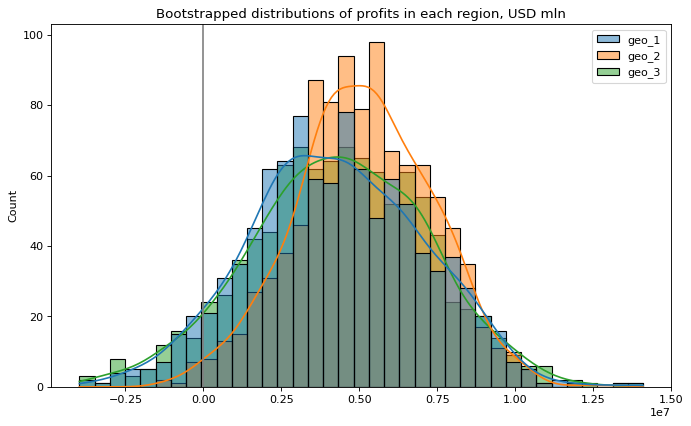

In [41]:
# distribution plot
plt.figure(figsize=(10,6), dpi= 80)
sns.histplot(viz_df, kde = True)
plt.axvline(0, c="grey")
plt.title('Bootstrapped distributions of profits in each region, USD mln')
plt.show()

When backed by the distribution of the actual profit of 200 best wells, we can conclude that the second region would have the average profit between USD5.0 mln and USD5.3 mln with 95% probability and it also imposes the lowest risk of the losses, 1% only compared to 6%-6.4% in the first and the third regions. This result matches the difference in the quality of the models for the regions. We should consult with the industry professionals to grasp better understanding of the oil sector and learn whether the risk level of 1% is acceptable: given the high capital-intensity of well development and relatively low ROI, why to drill and incure all the costs and environmental demage if there is any chance of losses. If oil prices go up, then the second region will definitely become the most attractive.

[Back to Content](#content)

## Conclusions and recommendations <a id='conclusions'></a>

1. We have uploaded the three datasets for three regions, of 100000 data points each, all columns and data types correct, no missing values, no duplicates.
2. The regions differ in some meaningful way by the features and volumes of reserves in the wells with the first and the third region demonstrating some minor similarity, on the `f2` feature and `product` only.
3. All three regions have similar standart deviation of the `product` values, though the second region has 50 lower average volume and is more skewed due to outliers.
4. We were initially bound to linear regression modeling, while the results are pretty strange in terms of the model quality; the second region demonstrating perfect predictive capability of the linear regression, while the first and the third regions demonstarte very poor model quality; that can maybe attributed to the data being simulated.
5. We have performed a simple visualization of the differences in the distribution of the feature values for the three regions.

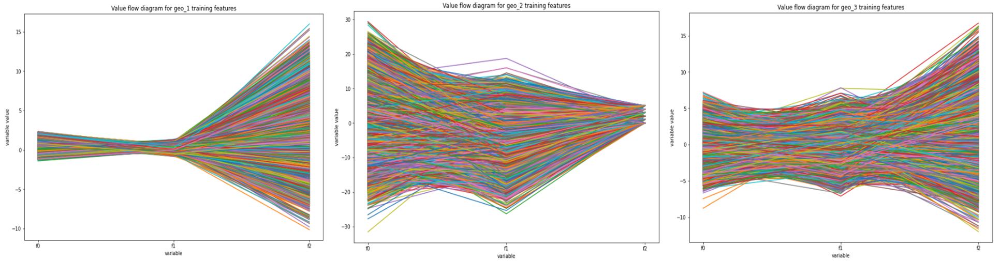

6. We calculated the minimum volume of reserves, on average, sufficient for developing a new well without losses; it equals ~111 units.
7. Preliminary estimates, based on the predicted volumes of reserves for a random set of 500 wells from the test subset, suggested that the investments should be channeled into the first region, though the comaprison with the actual reserves in the chosen 200 wells and the reserves in the 200 wells, which actually were the largest amon those 500, showed that this result is shallow.
8. To be able to derive any statistically significant conclusions, we applied the bootstrapping technique for assessing confidence intervals of ML models. In this case, bootstrapping refers to resampling data and instead of fitting the model to the original test features and target variable, fitting the model to resampled versions of them multiple times, 1000 in our case. Since we have already computed the predictions, instead fitting the model again, we can sample the original target test points and take corresponding predictions instead. For every run, after extracting the 200 top model predictions, we use the actual `product` values of those data points to calculate the actual profit. Then we use the 1000 of such estimates to derive the distribution of actual profits.
9. When backed by the distribution of the actual profit of 200 best wells, we were able to conclude that the second region would have the average profit between USD5.0 mln and USD5.3 mln with 95% probability and it also imposes the lowest risk of the losses, 1% only compared to 6%-6.4% in the first and the third regions. This result matches the difference in the quality of the models for the regions. We should consult with the industry professionals to grasp better understanding of the oil sector and learn whether the risk level of 1% is acceptable: given the high capital-intensity of well development and relatively low ROI, why to drill and incure all the costs and environmental demage if there is any chance of losses. If oil prices go up, then the second region will definitely become the most attractive.
10. Given the low quality of the regression models for the first and the third regions, considering other models can be beneficial.

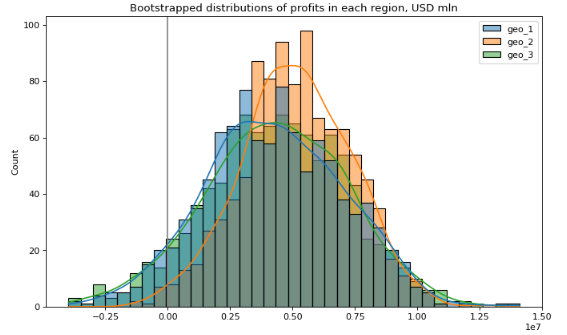